### Laboratorium 5 - zadania - transformacja Hougha

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

#### Zadanie 1

Zbadaj wpływ parametrów transformacji Hougha na jakość detekcji prostych na przykładzie obrazu `norway`. Wykorzystaj ulubiony detektor krawędzi i zaprezentuj jego wynik przed użyciem transformacji Hougha. Zapoznaj się z dokumentacją funkcji [`cv2.HoughLines`](https://docs.opencv.org/4.5.3/dd/d1a/group__imgproc__feature.html#ga46b4e588934f6c8dfd509cc6e0e4545a), zwłaszcza parametrami sterującymi rozdzielczością `rho`, `theta` oraz progiem (`threshold`). Błędnie dobrany próg może szczególnie negatywnie wpłynąć na wyniki.

Zacznij od znalezienia odpowiednich parametrów detektora krawędzi - jeśli na tym etapie wyniki będą słabe, to dalej będzie tylko gorzej (_garbage-in, garbage-out_) - ale nie skupiaj się na badaniu ich wpływu na wyniki.

Zadanie _nie_ polega na zrobieniu grid searcha parametrów transformacji Hougha, tylko na zrozumieniu zachowania parametrów `rho` i `theta`, oraz wpływu progu.

Ostateczny rezultat zaprezentuj w postaci odcinków naniesionych na kopię obrazu wejściowego (patrz komórka `[3]`).

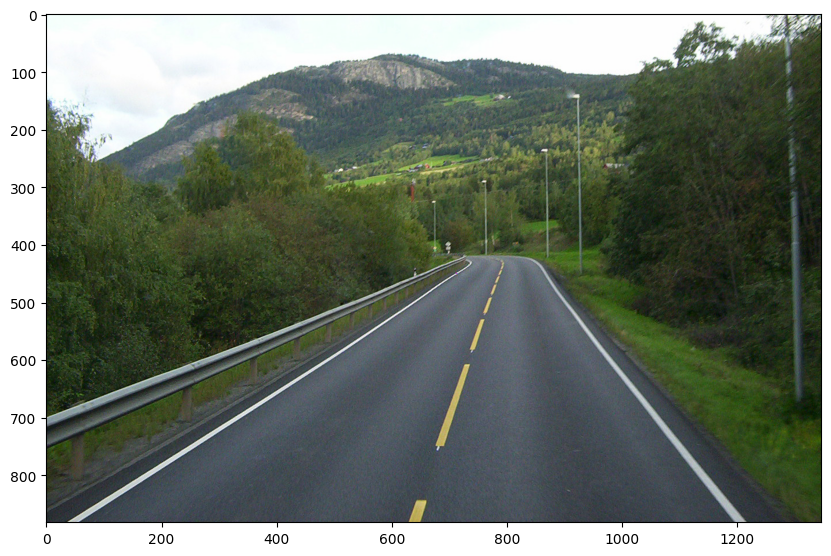

In [7]:
norway = cv2.imread('norway.jpg')[..., ::-1]
plt.subplots(1, 1, figsize=(10,10))[1].imshow(norway);

In [8]:
def rhotheta2xy(line):
    # konwersja parametrów prostej w układzie rho-theta do odcinka w układzie kartezjańskim
    # wynik można użyć jako argumenty funkcji cv2.line
    rho, theta = line[0]
    a = np.cos(theta)
    b = np.sin(theta)
    x0 = a*rho
    y0 = b*rho
    x1 = int(x0 + 5000*(-b))
    y1 = int(y0 + 5000*(a))
    x2 = int(x0 - 5000*(-b))
    y2 = int(y0 - 5000*(a))
    return x1, y1, x2, y2

Rozwiązanie:

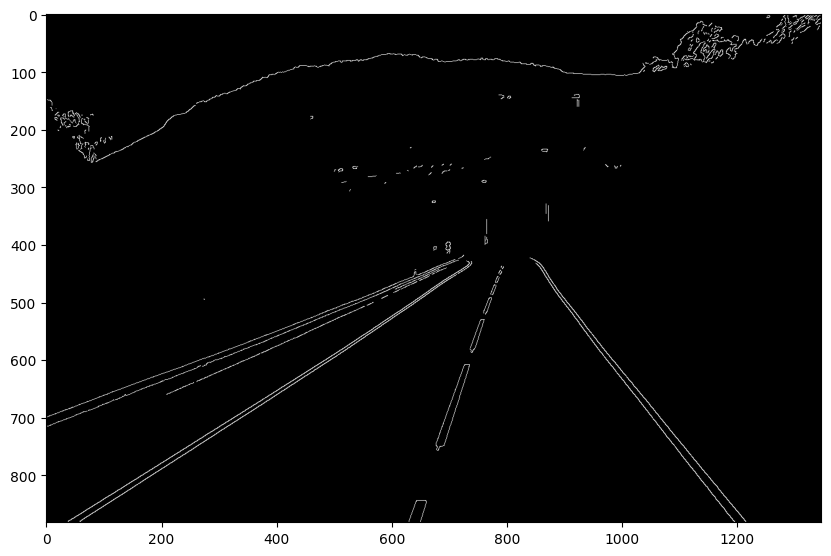

In [9]:
norway_gauss = cv2.GaussianBlur(cv2.cvtColor(norway, cv2.COLOR_RGB2GRAY), (5, 5), 0)
edges = cv2.Canny(norway_gauss, 200, 250, apertureSize=3)
plt.figure(figsize=(10, 10))
plt.imshow(edges, cmap='gray');

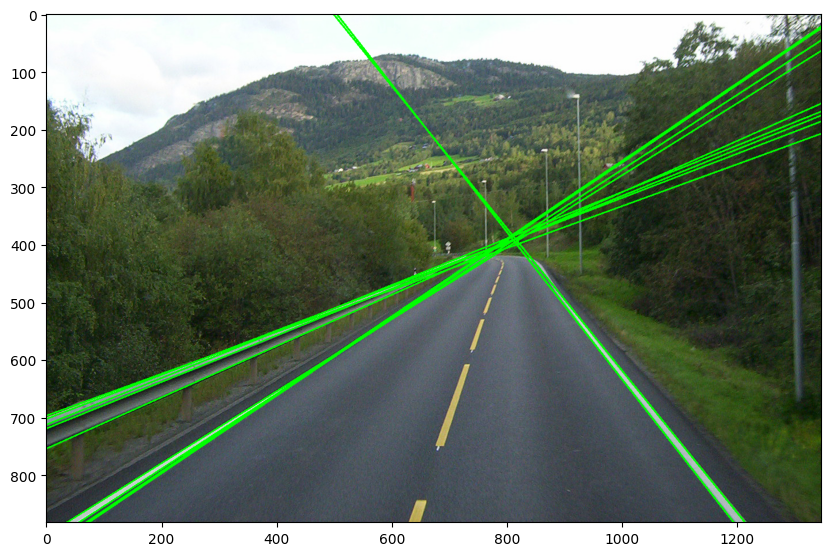

In [10]:
lines = cv2.HoughLines(edges, 1, np.pi/180, 200)
line_image = np.copy(norway) 
if lines is not None:
    for line in lines:
        x1, y1, x2, y2 = rhotheta2xy(line)  
        cv2.line(line_image, (x1, y1), (x2, y2), (0, 255, 0), 2)

plt.figure(figsize=(10,10))
plt.imshow(line_image);

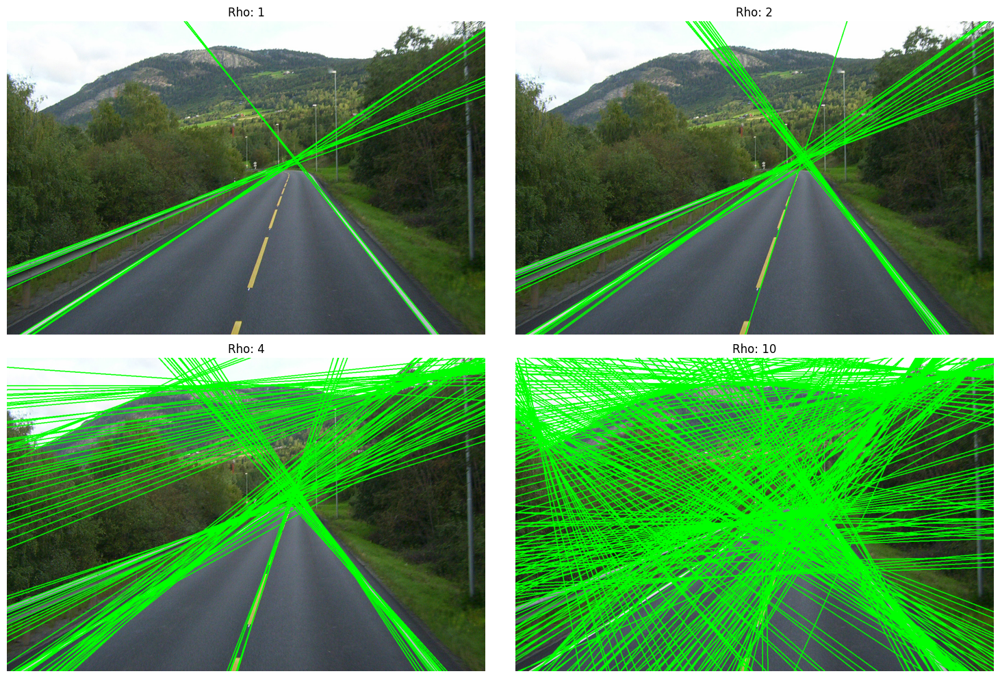

In [14]:
rho_values = [1, 2, 4, 10] 
theta = np.pi / 180  
threshold = 200  

plt.figure(figsize=(15, 10))
for i, rho in enumerate(rho_values):
    lines = cv2.HoughLines(edges, rho, theta, threshold)
    line_image = np.copy(norway)  

    if lines is not None:
        for line in lines:
            x1, y1, x2, y2 = rhotheta2xy(line) 
            cv2.line(line_image, (x1, y1), (x2, y2), (0, 255, 0), 2) 

    plt.subplot(2, 2, i + 1)
    plt.title(f"Rho: {rho}")
    plt.imshow(line_image)
    plt.axis('off')

plt.tight_layout()
plt.show()

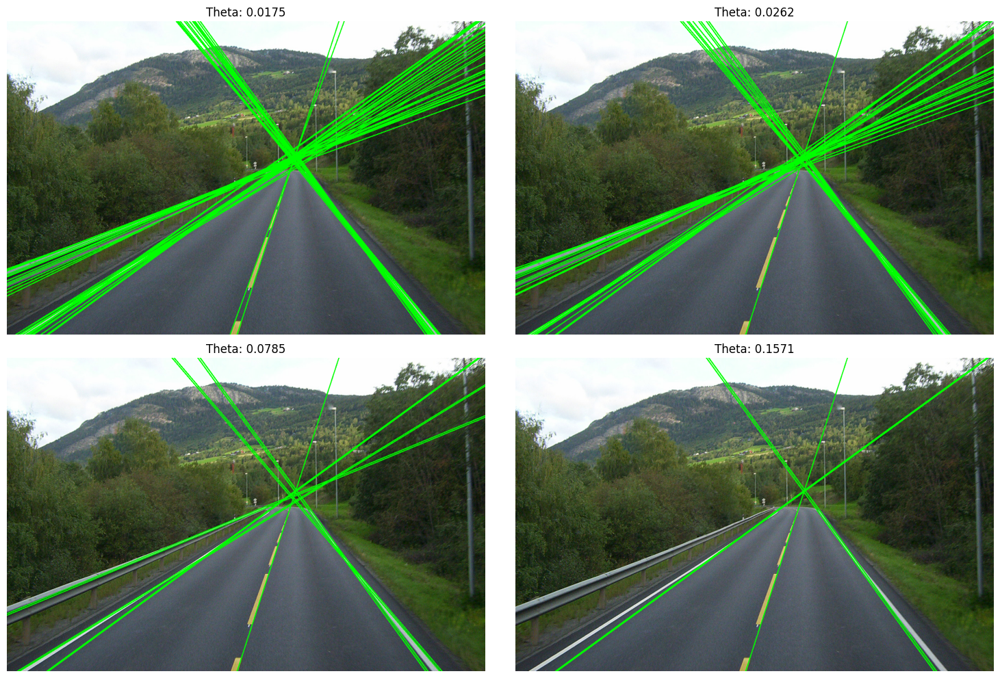

In [18]:
theta_values = [np.pi / 180, np.pi / 120, np.pi / 40, np.pi / 20]  
rho = 1  
threshold = 100

plt.figure(figsize=(15, 10))
for i, theta in enumerate(theta_values):
    lines = cv2.HoughLines(edges, rho, theta, threshold)
    line_image = np.copy(norway)  

    if lines is not None:
        for line in lines:
            x1, y1, x2, y2 = rhotheta2xy(line)  
            cv2.line(line_image, (x1, y1), (x2, y2), (0, 255, 0), 2)  

    plt.subplot(2, 2, i + 1)
    plt.title(f"Theta: {theta:.4f}")
    plt.imshow(line_image)
    plt.axis('off')

plt.tight_layout()
plt.show()

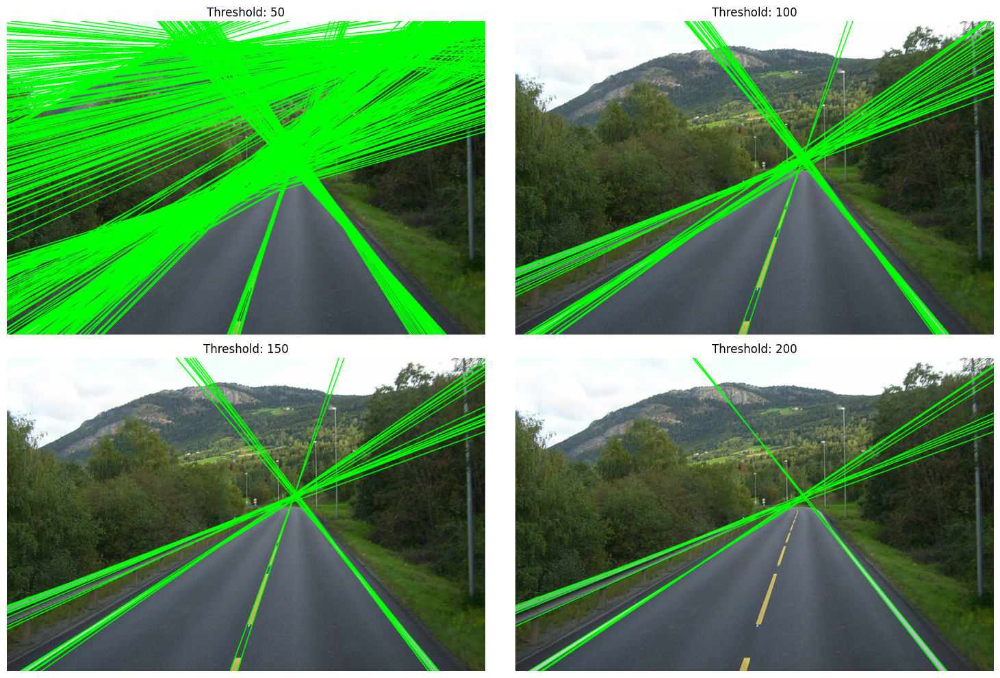

In [16]:
theta = np.pi/180
rho = 1  
threshold_values = [50, 100, 150, 200]

plt.figure(figsize=(15, 10))
for i, thresh in enumerate(threshold_values):
    lines = cv2.HoughLines(edges, rho, theta, thresh)
    line_image = np.copy(norway)  

    if lines is not None:
        for line in lines:
            x1, y1, x2, y2 = rhotheta2xy(line)  
            cv2.line(line_image, (x1, y1), (x2, y2), (0, 255, 0), 2)  

    plt.subplot(2, 2, i + 1)
    plt.title(f"Threshold: {thresh}")
    plt.imshow(line_image)
    plt.axis('off')

plt.tight_layout()
plt.show()

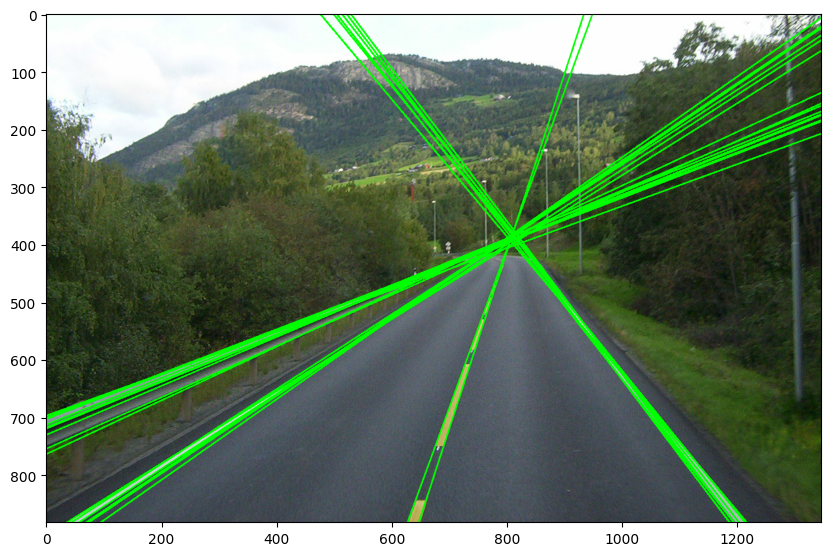

In [17]:
lines = cv2.HoughLines(edges, 1, np.pi/180, 150)
line_image = np.copy(norway) 
if lines is not None:
    for line in lines:
        x1, y1, x2, y2 = rhotheta2xy(line)  
        cv2.line(line_image, (x1, y1), (x2, y2), (0, 255, 0), 2)

plt.figure(figsize=(10,10))
plt.imshow(line_image);

#### Zadanie 2

Dany jest obraz `pillbox`. Wykorzystaj transformację Hougha dla prostych, aby wykryć krawędzie między komórkami organizera.

Dla odmiany, w tym zadaniu nie jest istotne badanie parametrów ale wyłącznie końcowy wynik.

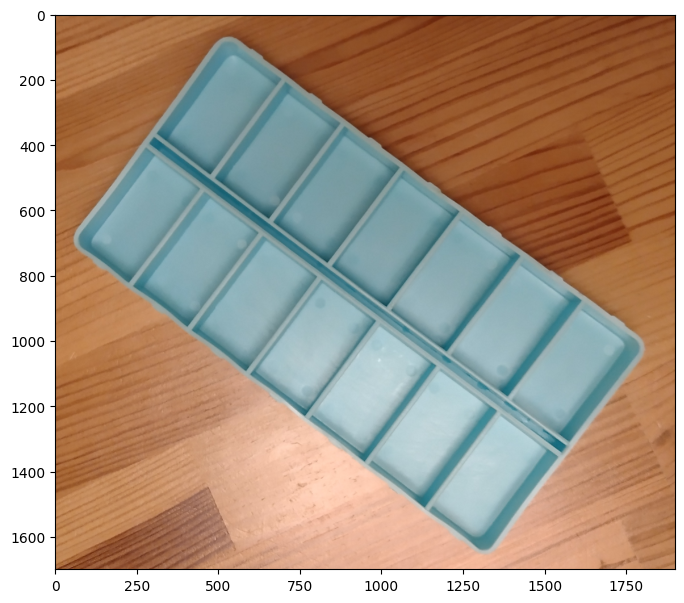

In [2]:
pillbox = cv2.imread('pillbox.png')[..., ::-1]
plt.subplots(1, 1, figsize=(8,8))[1].imshow(pillbox);

Rozwiązanie:

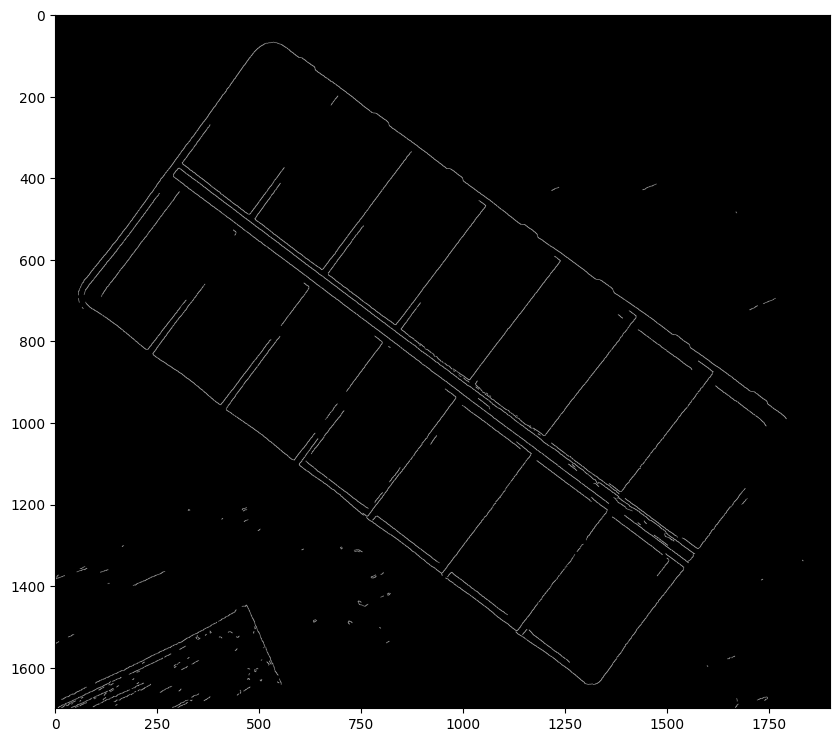

In [3]:
pillbox_gauss = cv2.GaussianBlur(cv2.cvtColor(pillbox, cv2.COLOR_RGB2GRAY), (5, 5), 0)
edges2 = cv2.Canny(pillbox_gauss, 70, 100, apertureSize=3)
plt.figure(figsize=(10, 10))
plt.imshow(edges2, cmap='gray');

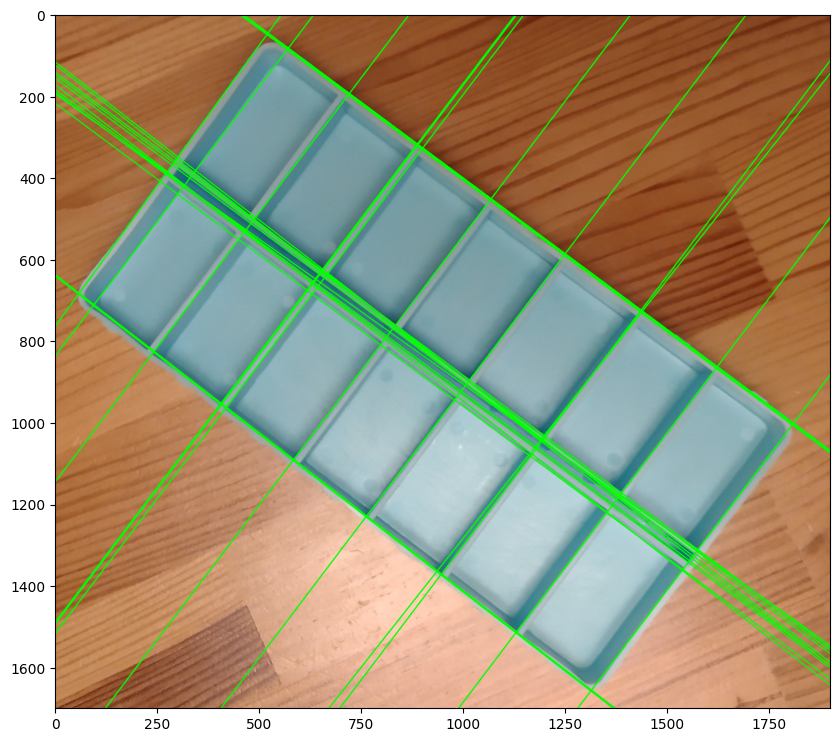

In [6]:
lines2 = cv2.HoughLines(edges2, 1, np.pi/155, 200)
line_image2 = np.copy(pillbox) 
if lines2 is not None:
    for line in lines2:
        x1, y1, x2, y2 = rhotheta2xy(line)  
        cv2.line(line_image2, (x1, y1), (x2, y2), (0, 255, 0), 2)

plt.figure(figsize=(10,10))
plt.imshow(line_image2);